In [ ]:
from google.colab.patches import cv2_imshow
import numpy as np
import cv2
import math
import matplotlib.pyplot as plt

In [ ]:
# # Unzip files
# import os, zipfile

# os.makedirs("data", exist_ok=True)
# with zipfile.ZipFile("data/data_coco.zip", 'r') as zip_ref:
#    zip_ref.extractall("data_coco")

In [ ]:
# # Convert YOLO to COCO format

# path_to_annotations = "data_coco/data_coco/test/bounding_box/"

# #Identify the path to get from the annotations to the images
# path_to_images = "../images/"

# #Import the dataset into the pylable schema
# yoloclasses = ['unripe', 'partially ripe', 'fully ripe']
# dataset = importer.ImportYoloV5(path=path_to_annotations, path_to_images=path_to_images, cat_names=yoloclasses,
#     img_ext="png", name="coco128")

# dataset.df.head(5)
# print(f"Number of images: {dataset.analyze.num_images}")
# print(f"Number of classes: {dataset.analyze.num_classes}")
# print(f"Classes:{dataset.analyze.classes}")
# print(f"Class counts:\n{dataset.analyze.class_counts}")

# dataset.export.ExportToCoco(cat_id_index=1)

In [ ]:
# Check nvcc version
!nvcc -V
# Check GCC version
!gcc --version

In [ ]:
# install dependencies: (use cu111 because colab has CUDA 11.1)
!pip install torch==1.9.0+cu111 torchvision==0.10.0+cu111 -f https://download.pytorch.org/whl/torch_stable.html

# install mmcv-full thus we could use CUDA operators
!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.9.0/index.html

# #Install mmdetection
# !rm -rf mmdetection
# !git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection

!pip install -e .

In [ ]:
from mmcv import collect_env
collect_env()

In [ ]:
# Check Pytorch installation
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

# Check MMDetection installation
import mmdet
print(mmdet.__version__)

# Check mmcv installation
from mmcv.ops import get_compiling_cuda_version, get_compiler_version
print(get_compiling_cuda_version())
print(get_compiler_version())

1.9.0+cu111 True

2.27.0

11.1

GCC 7.3


In [ ]:
import mmcv
from mmcv.runner import load_checkpoint

from mmdet.apis import inference_detector, show_result_pyplot
from mmdet.models import build_detector
from ctypes import sizeof

def build_model(config, checkpoint):
    # Set the device to be used for evaluation
    device='cuda:0' #'cpu

    # Load the config
    config = mmcv.Config.fromfile(config)
    # Set pretrained to be None since we do not need pretrained model here
    config.model.pretrained = None

    # Initialize the detector
    model = build_detector(config.model)

    # Load checkpoint
    checkpoint = load_checkpoint(model, checkpoint, map_location=device)

    # Set the classes of models for inference
    model.CLASSES = checkpoint['meta']['CLASSES']

    # We need to set the model's cfg for inference
    model.cfg = config

    # Convert the model to GPU
    model.to(device)
    # Convert the model into evaluation mode
    model.eval()

    return model

In [ ]:
def model_inference(model, threshold):
    # Use the detector to do inference
    test = ['363', '380', '404', '431', '451']
    for i in test:
        img = '../test_group15/images/' + str(i) + '.png'
        print("Image: " + str(i) + ".png")
        result = inference_detector(model, img)
        # print(result)

        count = []
        # Filter by threshold score
        for i, r in enumerate(result):
          scr = r[:, 4]
          count.append(scr[scr > threshold].size)

        # Print Strawberry Count
        unripe_count = count[0]
        partially_ripe_count = count[1]
        fully_ripe_count = count[2]
        total = unripe_count + partially_ripe_count + fully_ripe_count

        print("Unripe : ", unripe_count)
        print("Partially Ripe : ", partially_ripe_count)
        print("Fully Ripe' : ", fully_ripe_count)
        print("Total Strawberries Detected: ", total)
        text = "Total Strawberries: " + str(total)

        img_out = mmcv.imread(img)
        height, width, channels = img_out.shape
        cv2.putText(img_out, text, (20, height-30), cv2.FONT_HERSHEY_SIMPLEX, thickness=4, fontScale=1.5, color=(255, 255, 255))

        # Plot the result
        show_result_pyplot(model, img_out, result, score_thr=threshold) # Threshold = 0.4


In [ ]:
# Download the pre-trained checkpoints for training (Transfer Learning)
!wget -c https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r101_fpn_1x_coco/faster_rcnn_r101_fpn_1x_coco_20200130-f513f705.pth \
      -O checkpoints/faster_rcnn_r101_fpn_1x_coco_20200130-f513f705.pth.pth

In [ ]:
# Train using Strawberry Dataset
from mmdet.apis import set_random_seed
from mmcv import Config
cfg = Config.fromfile('./configs/faster_rcnn/faster_rcnn_r101_fpn_1x_coco.py') # Pre-trained detector.

In [ ]:
# Create config file 'configs/faster_rcnn/faster_rcnn_strawberry.py'

In [ ]:
# Train
!python tools/train.py configs/faster_rcnn/faster_rcnn_strawberry.py

/usr/local/lib/python3.8/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.

  warnings.warn(

/content/drive/MyDrive/Colab Notebooks/CV/Final_Project/mmdetection/mmdet/utils/setup_env.py:38: UserWarning: Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed.

  warnings.warn(

/content/drive/MyDrive/Colab Notebooks/CV/Final_Project/mmdetection/mmdet/utils/setup_env.py:48: UserWarning: Setting MKL_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please 

In [ ]:
!python tools/test.py configs/faster_rcnn/faster_rcnn_strawberry.py work_dirs/faster_rcnn_strawberry/latest.pth --eval bbox --show --show-dir 'work_dirs/faster_rcnn/test_results'

/usr/local/lib/python3.8/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.

  warnings.warn(

/content/drive/MyDrive/Colab Notebooks/CV/Final_Project/mmdetection/mmdet/utils/setup_env.py:38: UserWarning: Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed.

  warnings.warn(

/content/drive/MyDrive/Colab Notebooks/CV/Final_Project/mmdetection/mmdet/utils/setup_env.py:48: UserWarning: Setting MKL_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please 

In [ ]:
import mmcv
from mmcv.runner import load_checkpoint

from mmdet.apis import inference_detector, show_result_pyplot
from mmdet.models import build_detector

# Choose to use a config and initialize the detector
config = 'configs/faster_rcnn/faster_rcnn_strawberry.py'

# Setup a checkpoint file to load
checkpoint = 'work_dirs/faster_rcnn_strawberry/latest.pth'

# Build model
model = build_model(config, checkpoint)

# Evaluate model
model.eval()

load checkpoint from local path: work_dirs/faster_rcnn_strawberry/latest.pth


FasterRCNN(
  (backbone): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): ResLayer(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
        

In [ ]:
# # Run model on test data
# model_inference(model, threshold=0.5)

In [ ]:
# Resume Training
!python tools/train.py configs/faster_rcnn/faster_rcnn_strawberry.py --auto-resume

/usr/local/lib/python3.8/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.

  warnings.warn(

/content/drive/MyDrive/Colab Notebooks/CV/Final_Project/mmdetection/mmdet/utils/setup_env.py:38: UserWarning: Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed.

  warnings.warn(

/content/drive/MyDrive/Colab Notebooks/CV/Final_Project/mmdetection/mmdet/utils/setup_env.py:48: UserWarning: Setting MKL_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please 

In [ ]:
!python tools/test.py configs/faster_rcnn/faster_rcnn_strawberry.py work_dirs/faster_rcnn_strawberry/latest.pth --eval bbox --show --show-dir 'work_dirs/faster_rcnn/test_results_final'

/usr/local/lib/python3.8/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.

  warnings.warn(

/content/drive/MyDrive/Colab Notebooks/CV/Final_Project/mmdetection/mmdet/utils/setup_env.py:38: UserWarning: Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed.

  warnings.warn(

/content/drive/MyDrive/Colab Notebooks/CV/Final_Project/mmdetection/mmdet/utils/setup_env.py:48: UserWarning: Setting MKL_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please 

In [ ]:
 # Choose to use a config and initialize the detector
config = 'configs/faster_rcnn/faster_rcnn_strawberry.py'

# Setup a checkpoint file to load
checkpoint = 'work_dirs/faster_rcnn_strawberry/latest.pth'

# Build model
model = build_model(config, checkpoint)

# Evaluate model
model.eval()

load checkpoint from local path: work_dirs/faster_rcnn_strawberry/latest.pth


FasterRCNN(
  (backbone): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): ResLayer(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
        

Image: 363.png


/content/drive/MyDrive/Colab Notebooks/CV/Final_Project/mmdetection/mmdet/datasets/utils.py:66: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.

  warnings.warn(

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)

  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


Unripe :  8

Partially Ripe :  0

Fully Ripe' :  2

Total Strawberries Detected:  10


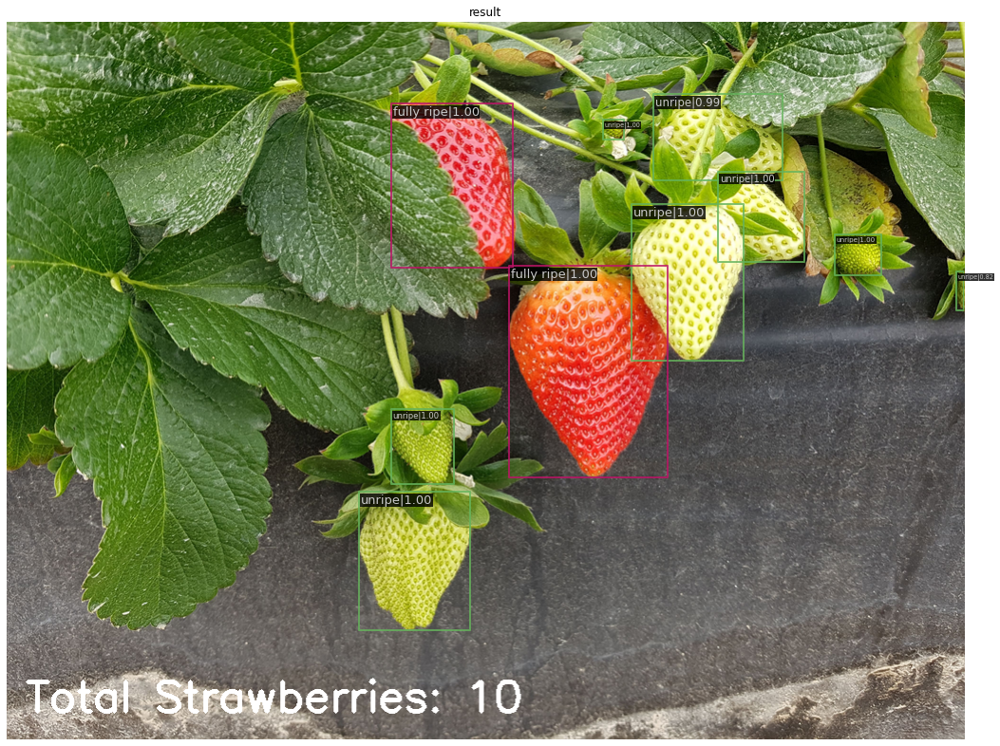

Image: 380.png

Unripe :  3

Partially Ripe :  1

Fully Ripe' :  0

Total Strawberries Detected:  4


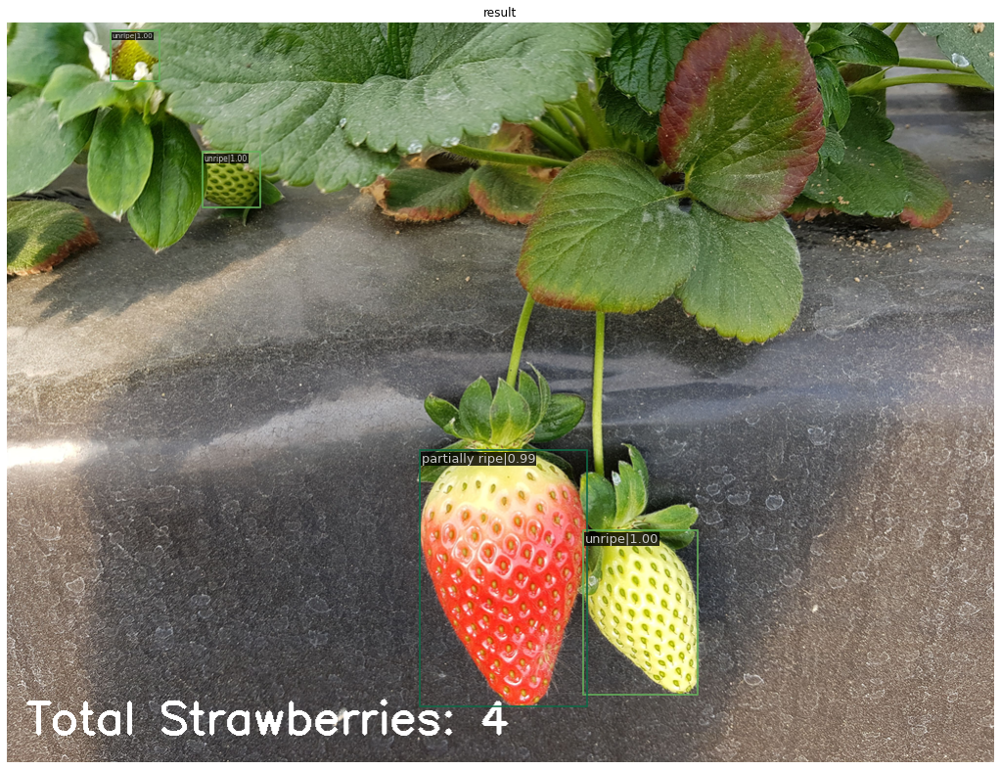

Image: 404.png

Unripe :  4

Partially Ripe :  1

Fully Ripe' :  2

Total Strawberries Detected:  7


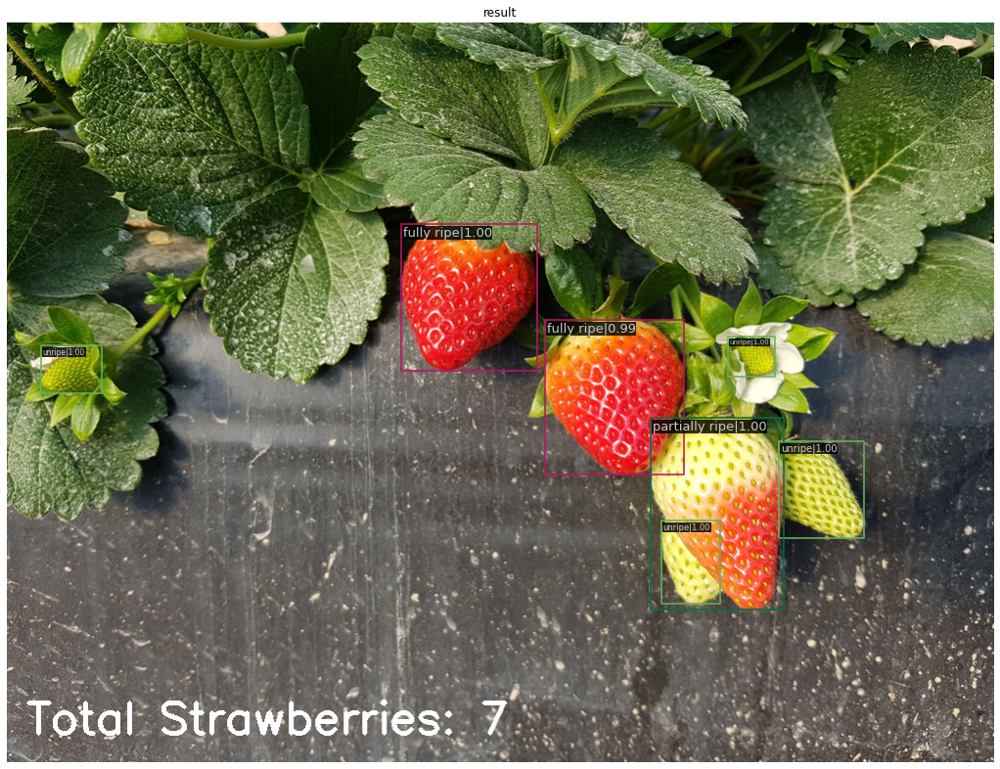

Image: 431.png

Unripe :  5

Partially Ripe :  1

Fully Ripe' :  0

Total Strawberries Detected:  6


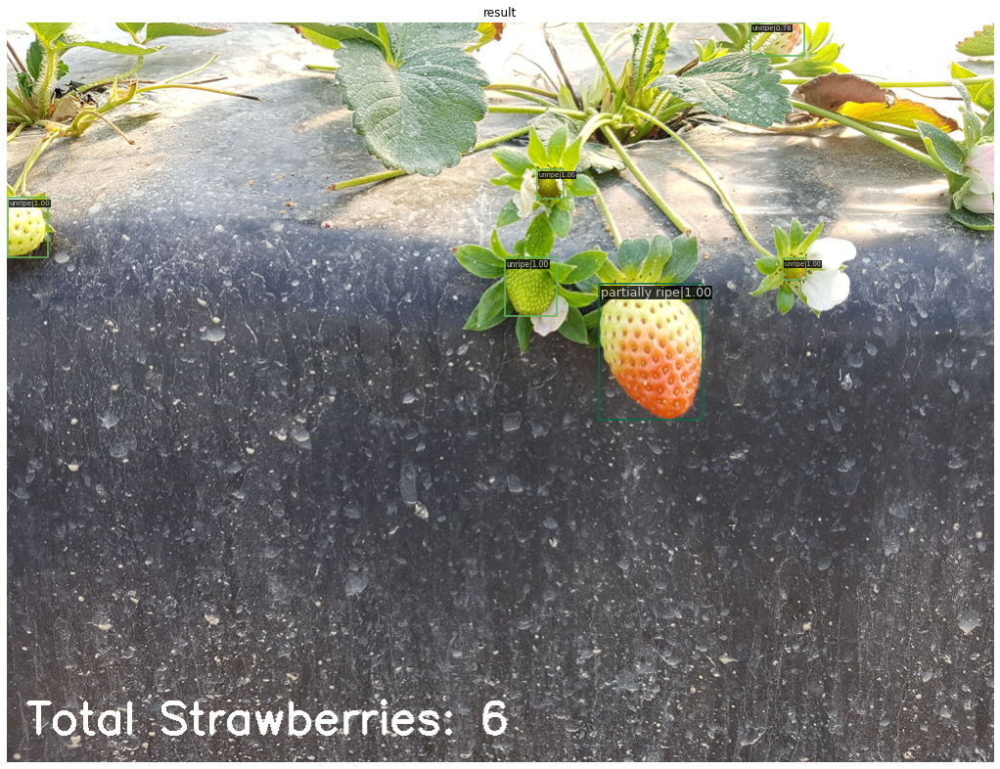

Image: 451.png

Unripe :  1

Partially Ripe :  1

Fully Ripe' :  1

Total Strawberries Detected:  3


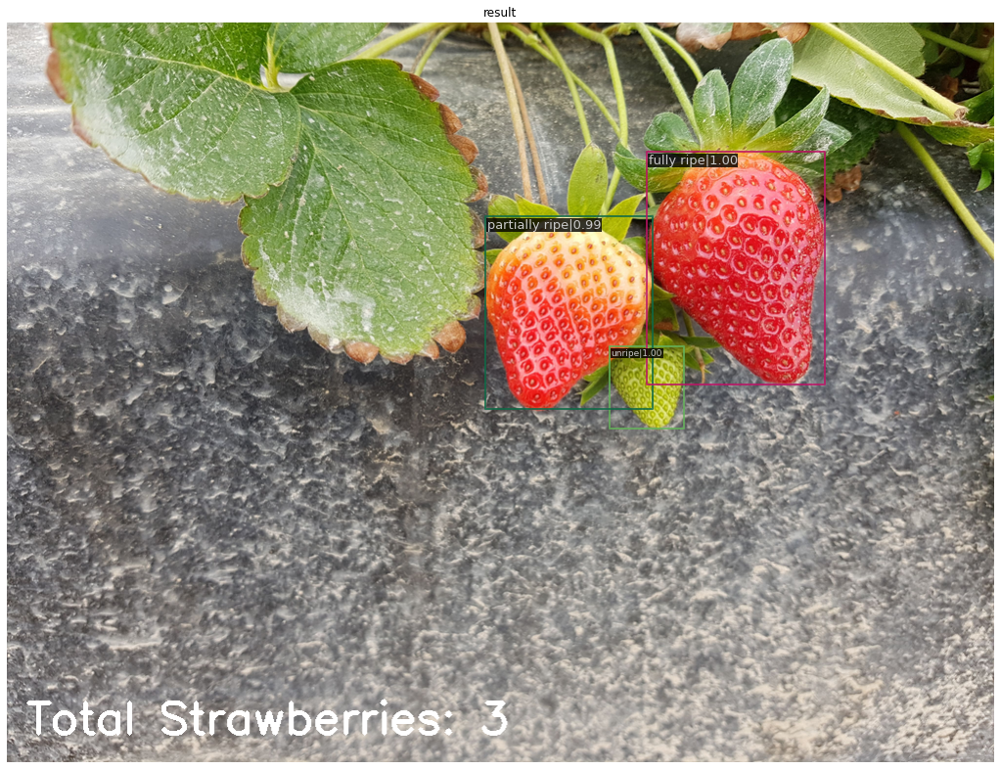

In [ ]:
# Run model on test data (Show detections with accuracy score >= 50%)
model_inference(model, threshold=0.5)

In [ ]:
!python tools/test.py \
       configs/faster_rcnn/faster_rcnn_strawberry.py \
       work_dirs/faster_rcnn_strawberry/latest.pth \
       --out work_dirs/faster_rcnn_strawberry/results.pkl \
       --eval bbox \
       --options "jsonfile_prefix=./work_dirs/faster_rcnn_strawberry/results"

/usr/local/lib/python3.8/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.

  warnings.warn(

tools/test.py:116: UserWarning: --options is deprecated in favor of --eval-options

  warnings.warn('--options is deprecated in favor of --eval-options')

/content/drive/MyDrive/Colab Notebooks/CV/Final_Project/mmdetection/mmdet/utils/setup_env.py:38: UserWarning: Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed.

  warnings.warn(

/content/drive/MyDrive/Colab Notebooks/CV/Final_Project/mmdetection/mmdet/utils/set

In [ ]:
!python tools/analysis_tools/coco_error_analysis.py \
       'work_dirs/faster_rcnn_strawberry/results.bbox.json' \
       results \
       --ann='../data_coco/data_coco/val/coco128.json' \
       --extraplots

loading annotations into memory...

Done (t=0.91s)

creating index...

index created!

Loading and preparing results...

DONE (t=0.01s)

creating index...

index created!

Running per image evaluation...

Evaluate annotation type *bbox*

DONE (t=0.16s).

Accumulating evaluation results...

DONE (t=0.01s).

--------------analyzing 2-unripe---------------

creating index...

index created!

--------------analyzing 1-partially ripe---------------

--------------analyzing 3-fully ripe---------------

creating index...

index created!

Running per image evaluation...

Evaluate annotation type *bbox*

Running per image evaluation...

Evaluate annotation type *bbox*

creating index...

index created!

Running per image evaluation...

Evaluate annotation type *bbox*

DONE (t=0.17s).

Accumulating evaluation results...

DONE (t=0.01s).

DONE (t=0.20s).

Accumulating evaluation results...

DONE (t=0.01s).

Running per image evaluation...

Evaluate annotation type *bbox*

Running per image evalua

In [ ]:
# Get FPS
!python -m torch.distributed.launch --nproc_per_node=1 --master_port=29500 tools/analysis_tools/benchmark.py \
        configs/faster_rcnn/faster_rcnn_strawberry.py \
        work_dirs/faster_rcnn_strawberry/latest.pth \
       --launcher pytorch

/usr/local/lib/python3.8/dist-packages/torch/distributed/launch.py:163: DeprecationWarning: The 'warn' method is deprecated, use 'warning' instead

  logger.warn(

The module torch.distributed.launch is deprecated and going to be removed in future.Migrate to torch.distributed.run


 Please read local_rank from `os.environ('LOCAL_RANK')` instead.

INFO:torch.distributed.launcher.api:Starting elastic_operator with launch configs:

  entrypoint       : tools/analysis_tools/benchmark.py

  min_nodes        : 1

  max_nodes        : 1

  nproc_per_node   : 1

  run_id           : none

  rdzv_backend     : static

  rdzv_endpoint    : 127.0.0.1:29500

  rdzv_configs     : {'rank': 0, 'timeout': 900}

  max_restarts     : 3

  monitor_interval : 5

  log_dir          : None

  metrics_cfg      : {}



INFO:torch.distributed.elastic.agent.server.local_elastic_agent:log directory set to: /tmp/torchelastic_1k62t7nc/none_farxz10r

INFO:torch.distributed.elastic.agent.server.api:[default] startin

In [ ]:
# Get Confusion Matrix
!python tools/analysis_tools/confusion_matrix.py \
    configs/faster_rcnn/faster_rcnn_strawberry.py \
    work_dirs/faster_rcnn_strawberry/results.pkl \
    results --show

/usr/local/lib/python3.8/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.

  warnings.warn(

loading annotations into memory...

Done (t=0.01s)

creating index...

index created!

[>>] 200/200, 2487.1 task/s, elapsed: 0s, ETA:     0sFigure(360x288)


In [ ]:
!python tools/analysis_tools/analyze_logs.py plot_curve \
    'work_dirs/faster_rcnn_strawberry/results.bbox.json' \
    --out results